## Week 2: Data Visualization Fundamentals

Sep 12, 2022

## Housekeeping

- Piazza website: https://piazza.com/upenn/fall2022/musa550
- HW #1 due one week from today (9/19)
- Office hours:
    - Nick: 10am-12pm on Saturday
    - Kristin: Tues/Thurs from 11am-12pm
    - Sign-up for time slots on Canvas calendar

Questions / concerns?
- Email: nhand@design.upenn.edu
- Post questions on Piazza

## Guides

Guides to installing Python, using conda for managing packages, and working with Jupyter notebook on course website:

- [Zero to Python](https://musa-550-fall-2022.github.io/guides/zero-to-python)
- [Conda User Guide](https://musa-550-fall-2022.github.io/guides/conda)
- [Common Conda Issues](https://musa-550-fall-2022.github.io/guides/conda-issues)
- [Jupyter User Guide](https://musa-550-fall-2022.github.io/guides/jupyter)

## Git & GitHub Resources

- [Setting up git](https://help.github.com/articles/set-up-git/)
- [Managing files on GitHub](https://help.github.com/articles/managing-files-on-github/)
- [Managing files via the command line](https://help.github.com/articles/managing-files-using-the-command-line/)

## File paths and working directories

Piazza post walking through somes tips for managing the folder structure on your laptop:

https://piazza.com/class/l7ewjjtnsdw53o/post/18

## Reminder: following along with lectures


### Easiest option: Binder


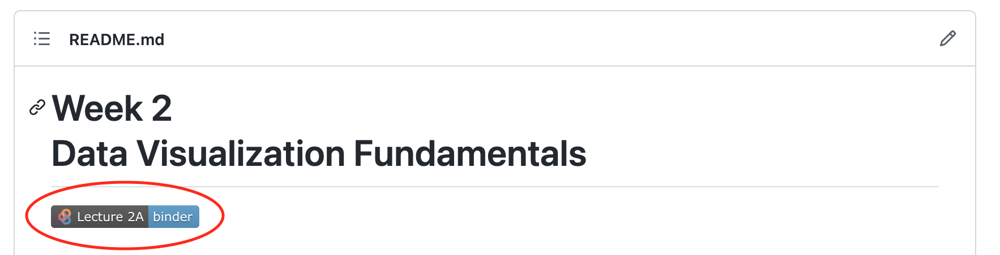

### Harder option: downloading Github repository contents

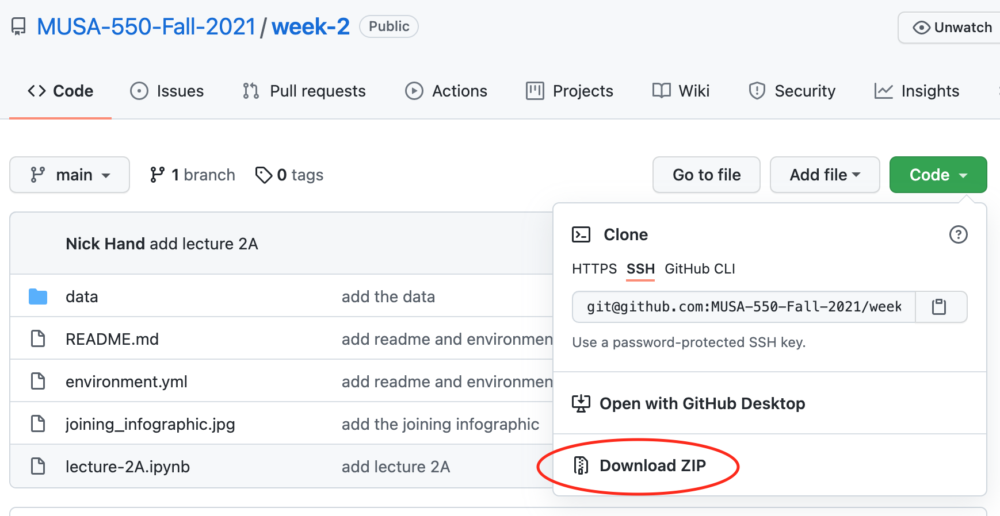

## Today's agenda

**Part 1**
- Wrapping up last week's pandas introduction

**Part 2**
- A brief overview of data visualization
- Practical tips on color in data vizualization
- The Python landscape:
    - [matplotlib](https://matplotlib.org/)
    - [seaborn](https://seaborn.pydata.org/)
    - [altair](https://altair-viz.github.io/)
    

## Continuing with pandas: Zillow rental and home value data

In [39]:
import pandas as pd
from matplotlib import pyplot as plt

Load citywide Zillow Rent Index (ZRI) and Zillow Home Value Index (ZHVI) data. 

Files were downloaded from https://www.zillow.com/research/data/

In [3]:
home_values = pd.read_csv("data/zillow/Metro_zhvi_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv")
rent_values = pd.read_csv("data/zillow/Metro_ZORI_AllHomesPlusMultifamily_SSA.csv")

Peek at the first few rows of the ZRI data:

In [4]:
rent_values.head()

,RegionID,RegionName,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,...,2020-10,2020-11,2020-12,2021-01,2021-02,2021-03,2021-04,2021-05,2021-06,2021-07
0,102001,United States,0,1356.0,1361,1367.0,1373,1378,1384,1390,...,1712,1721,1729,1738,1747,1757,1766,1776.0,1786,1796
1,394913,"New York, NY",1,2205.0,2214,2224.0,2234,2244,2254,2264,...,2437,2433,2428,2424,2421,2418,2415,2414.0,2413,2413
2,753899,"Los Angeles-Long Beach-Anaheim, CA",2,1868.0,1879,1890.0,1902,1913,1924,1935,...,2529,2538,2546,2554,2563,2572,2581,2591.0,2601,2611
3,394463,"Chicago, IL",3,1437.0,1441,1445.0,1449,1453,1456,1460,...,1651,1653,1655,1657,1659,1662,1664,1667.0,1670,1674
4,394514,"Dallas-Fort Worth, TX",4,1179.0,1182,1186.0,1190,1194,1198,1202,...,1519,1529,1540,1551,1562,1573,1585,1597.0,1608,1620


And do the same for the ZHVI data:

In [5]:
home_values.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,1996-01-31,1996-02-29,1996-03-31,1996-04-30,1996-05-31,...,2020-10-31,2020-11-30,2020-12-31,2021-01-31,2021-02-28,2021-03-31,2021-04-30,2021-05-31,2021-06-30,2021-07-31
0,102001,0,United States,Country,NaN,107860.0,107887.0,107937.0,108064.0,108208.0,...,262913.0,265716.0,268690.0,271763.0,275071.0,278662.0,282735.0,287579.0,293121.0,298933.0
1,394913,1,"New York, NY",Msa,NY,186908.0,186471.0,186194.0,185663.0,185347.0,...,499371.0,504428.0,509356.0,514095.0,518935.0,524000.0,529570.0,536247.0,544198.0,552607.0
2,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,184839.0,185096.0,185116.0,185224.0,185197.0,...,719725.0,727136.0,735212.0,743347.0,752071.0,761150.0,773063.0,790724.0,811628.0,831593.0
3,394463,3,"Chicago, IL",Msa,IL,147491.0,147472.0,147351.0,147412.0,147317.0,...,252974.0,255348.0,257714.0,259803.0,262422.0,265051.0,268420.0,271938.0,276069.0,280130.0
4,394514,4,"Dallas-Fort Worth, TX",Msa,TX,112545.0,112609.0,112770.0,113092.0,113439.0,...,268525.0,271296.0,274597.0,277507.0,281346.0,285684.0,291484.0,298128.0,305540.0,313393.0


## Selecting the cities we want

In [6]:
valid_cities = [
    "New York, NY",
    "Chicago, IL",
    "Los Angeles-Long Beach-Anaheim, CA",
    "Philadelphia, PA",
    "Houston, TX",
    "Phoenix, AZ",
]

In [7]:
selection =  home_values['RegionName'].isin(valid_cities)
home_values_trimmed = home_values.loc[selection]

In [8]:
selection = rent_values['RegionName'].isin(valid_cities)
rent_values_trimmed = rent_values.loc[selection]

In [9]:
rent_values_trimmed

,RegionID,RegionName,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,...,2020-10,2020-11,2020-12,2021-01,2021-02,2021-03,2021-04,2021-05,2021-06,2021-07
1,394913,"New York, NY",1,2205.0,2214,2224.0,2234,2244,2254,2264,...,2437,2433,2428,2424,2421,2418,2415,2414.0,2413,2413
2,753899,"Los Angeles-Long Beach-Anaheim, CA",2,1868.0,1879,1890.0,1902,1913,1924,1935,...,2529,2538,2546,2554,2563,2572,2581,2591.0,2601,2611
3,394463,"Chicago, IL",3,1437.0,1441,1445.0,1449,1453,1456,1460,...,1651,1653,1655,1657,1659,1662,1664,1667.0,1670,1674
5,394974,"Philadelphia, PA",5,1456.0,1458,1459.0,1461,1463,1465,1467,...,1723,1729,1735,1741,1748,1754,1761,1768.0,1774,1781
6,394692,"Houston, TX",6,1135.0,1142,1149.0,1155,1161,1168,1174,...,1319,1325,1331,1336,1342,1348,1354,1361.0,1368,1374
14,394976,"Phoenix, AZ",14,997.0,1001,1005.0,1009,1013,1017,1021,...,1530,1551,1573,1595,1617,1640,1662,1686.0,1709,1732


## Removing unwanted columns

Unwanted columns can be *dropped* from the data frame using the `drop()` function.

Note that the column axis is the second axis (`axis=1`), and if you wanted to remove rows, you could use the first axis (`axis=0`).

In [10]:
x = ['SizeRank', 'RegionID', "RegionType", "StateName"]
home_values_final = home_values_trimmed.drop(x, axis=1)

In [11]:
columns = ['SizeRank', 'RegionID']
rent_values_final = rent_values_trimmed.drop(columns, axis=1)

In [12]:
rent_values_final

,RegionName,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,...,2020-10,2020-11,2020-12,2021-01,2021-02,2021-03,2021-04,2021-05,2021-06,2021-07
1,"New York, NY",2205.0,2214,2224.0,2234,2244,2254,2264,2273,2283,...,2437,2433,2428,2424,2421,2418,2415,2414.0,2413,2413
2,"Los Angeles-Long Beach-Anaheim, CA",1868.0,1879,1890.0,1902,1913,1924,1935,1947,1958,...,2529,2538,2546,2554,2563,2572,2581,2591.0,2601,2611
3,"Chicago, IL",1437.0,1441,1445.0,1449,1453,1456,1460,1463,1467,...,1651,1653,1655,1657,1659,1662,1664,1667.0,1670,1674
5,"Philadelphia, PA",1456.0,1458,1459.0,1461,1463,1465,1467,1469,1471,...,1723,1729,1735,1741,1748,1754,1761,1768.0,1774,1781
6,"Houston, TX",1135.0,1142,1149.0,1155,1161,1168,1174,1180,1186,...,1319,1325,1331,1336,1342,1348,1354,1361.0,1368,1374
14,"Phoenix, AZ",997.0,1001,1005.0,1009,1013,1017,1021,1025,1030,...,1530,1551,1573,1595,1617,1640,1662,1686.0,1709,1732


## Wide vs long format for datasets

Currently, our data is in **wide** format $\rightarrow$ each observation has its own column. This usually results in many columns but few rows.

In [13]:
home_values_final

,RegionName,1996-01-31,1996-02-29,1996-03-31,1996-04-30,1996-05-31,1996-06-30,1996-07-31,1996-08-31,1996-09-30,...,2020-10-31,2020-11-30,2020-12-31,2021-01-31,2021-02-28,2021-03-31,2021-04-30,2021-05-31,2021-06-30,2021-07-31
1,"New York, NY",186908.0,186471.0,186194.0,185663.0,185347.0,185059.0,184882.0,184790.0,184835.0,...,499371.0,504428.0,509356.0,514095.0,518935.0,524000.0,529570.0,536247.0,544198.0,552607.0
2,"Los Angeles-Long Beach-Anaheim, CA",184839.0,185096.0,185116.0,185224.0,185197.0,185225.0,185325.0,185277.0,185163.0,...,719725.0,727136.0,735212.0,743347.0,752071.0,761150.0,773063.0,790724.0,811628.0,831593.0
3,"Chicago, IL",147491.0,147472.0,147351.0,147412.0,147317.0,147480.0,147523.0,148537.0,149784.0,...,252974.0,255348.0,257714.0,259803.0,262422.0,265051.0,268420.0,271938.0,276069.0,280130.0
5,"Philadelphia, PA",120665.0,120510.0,120370.0,120127.0,119962.0,119867.0,119823.0,119801.0,119842.0,...,268118.0,271333.0,274637.0,277895.0,281276.0,285001.0,288799.0,293343.0,298129.0,302822.0
6,"Houston, TX",110158.0,110234.0,110242.0,110391.0,110531.0,110631.0,110669.0,110729.0,110896.0,...,228397.0,230431.0,232626.0,235215.0,238045.0,240714.0,243831.0,247646.0,252661.0,258174.0
14,"Phoenix, AZ",113486.0,113802.0,114163.0,114858.0,115537.0,116149.0,116715.0,117234.0,117747.0,...,315444.0,321009.0,326891.0,333799.0,340815.0,348899.0,356187.0,366575.0,378013.0,390733.0


Usually it's better to have data in [**tidy**](https://en.wikipedia.org/wiki/Tidy_data) (also known as **long**) format.

Tidy datasets are arranged such that each variable is a column and each observation is a row.

In our case, we want to have a column called `ZRI` and one called `ZHVI` and a row for each month that the indices were measured. 

*pandas* provides the `melt()` function for converting from **wide** formats to **tidy** formats.

`melt()` **doesn’t** aggregate or summarize the data. It transforms it into a different shape, but it contains the exact same information as before.

Imagine you have 6 rows of data (each row is a unique city) with 10 columns of home values (each column is a different month). That is wide data and is the format usually seen in spreadsheets or tables in a report.

If you `melt()` that wide data, you would get a table with 60 rows and 3 columns. Each row would contain the city name, the month, and the home value that city and month. This tidy-formatted data contains the same info as the wide data, but in a different form.

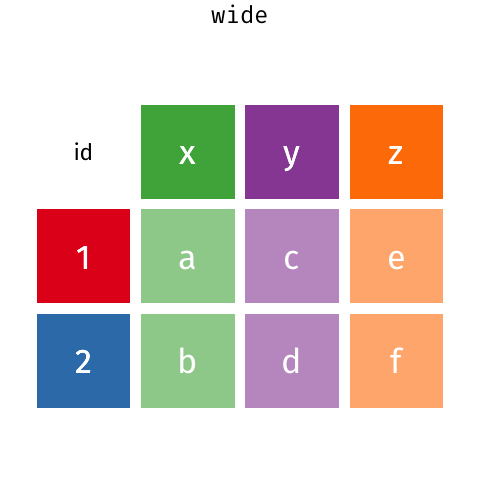

**This animation shows the transformation from wide to long / long to wide. You can ignore gather() and spread() - those are the R versions of the pandas functions.**

In [14]:
pd.melt?

Now, let's *melt* our datasets:

In [15]:
ZHVI = pd.melt(
    home_values_final, 
    id_vars=["RegionName"], 
    value_name="ZHVI", 
    var_name="Date"
)
ZRI = pd.melt(
    rent_values_final, 
    id_vars=["RegionName"], 
    value_name="ZRI", 
    var_name="Date"
)

and take a look:

In [16]:
ZRI.tail()

,RegionName,Date,ZRI
541,"Los Angeles-Long Beach-Anaheim, CA",2021-07,2611.0
542,"Chicago, IL",2021-07,1674.0
543,"Philadelphia, PA",2021-07,1781.0
544,"Houston, TX",2021-07,1374.0
545,"Phoenix, AZ",2021-07,1732.0


In [17]:
ZHVI.head()

,RegionName,Date,ZHVI
0,"New York, NY",1996-01-31,186908.0
1,"Los Angeles-Long Beach-Anaheim, CA",1996-01-31,184839.0
2,"Chicago, IL",1996-01-31,147491.0
3,"Philadelphia, PA",1996-01-31,120665.0
4,"Houston, TX",1996-01-31,110158.0


## Merging data frames

Another common operation is **merging**, also known as **joining**, two datasets. 

We can use the `merge()` function to merge observations that have the same `Date` and `RegionName` values.

## But first! Our date string formats don't match!

- `ZVHI` has the Date column in the format of YYYY-MM-DD
- `ZRI` has the Date column in the format of YYYY-MM

**We need to put them into the same format before merging the data!**

We can fix this by create `Datetime` objects and formatting the dates into the same format.

## Datetime objects
Currently our `Date` column is stored as a `string`. 

*pandas* includes additional functionality for dates, but first we must convert the strings using the `to_datetime()` function.

In [18]:
# Convert the Date column to Datetime objects
ZHVI["Date"] = pd.to_datetime(ZHVI["Date"])

## The `strftime` function

We can use the [".dt" property](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.dt.html) of the `Date` column to access datetime functions of the new Datetime column.

For converting to strings in a certain format, we can use the "strftime" function ([docs](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.dt.strftime.html)). This uses a special syntax to convert the date object to a string with a specific format. 

**Important reference:** Use the [this strftime guide](https://strftime.org/) to look up the syntax!

In [19]:
# Extract YYYY-MM string
date_strings = ZHVI["Date"].dt.strftime("%Y-%m")

In [20]:
# First entry is a string!
date_strings.iloc[0]

'1996-01'

In [21]:
# Add the strings back as a column
ZHVI["Date"] = date_strings

In [22]:
ZHVI.head()

,RegionName,Date,ZHVI
0,"New York, NY",1996-01,186908.0
1,"Los Angeles-Long Beach-Anaheim, CA",1996-01,184839.0
2,"Chicago, IL",1996-01,147491.0
3,"Philadelphia, PA",1996-01,120665.0
4,"Houston, TX",1996-01,110158.0


## Now we can merge!

In [24]:
# Left dataframe is ZRI
# Right dataframe is ZHVI

zillow_data = pd.merge(ZRI, ZHVI, on=['Date', 'RegionName'], how='outer')

In [26]:
# Let's sort the data by Date
zillow_data  = zillow_data.sort_values("Date", ascending=True)

zillow_data

,RegionName,Date,ZRI,ZHVI
546,"New York, NY",1996-01,NaN,186908.0
551,"Phoenix, AZ",1996-01,NaN,113486.0
550,"Houston, TX",1996-01,NaN,110158.0
547,"Los Angeles-Long Beach-Anaheim, CA",1996-01,NaN,184839.0
548,"Chicago, IL",1996-01,NaN,147491.0
...,...,...,...,...
541,"Los Angeles-Long Beach-Anaheim, CA",2021-07,2611.0,831593.0
542,"Chicago, IL",2021-07,1674.0,280130.0
543,"Philadelphia, PA",2021-07,1781.0,302822.0
544,"Houston, TX",2021-07,1374.0,258174.0


Merging is very powerful and the merge can be done in a number of ways. In this case, we did a **outer merge** in order to keep all parts of each dataframe. By contrast, the **inner merge** only keeps the overlapping intersection of the merge.

See the [infographic](joining_infographic.jpg) on joining in this repository.

In [27]:
# Convert the Date column back to a Datetime
zillow_data["Date"] = pd.to_datetime(zillow_data["Date"])

**Quick trick:** `Series` that hold `Datetime` objects have a `dt` attribute that let's you grab parts of the date easily. 

For example, we can easily add new columns for the month and year using:

In [28]:
# Note the the dtype is now datetime64[ns]
zillow_data['Date'].head()

546   1996-01-01
551   1996-01-01
550   1996-01-01
547   1996-01-01
548   1996-01-01
Name: Date, dtype: datetime64[ns]

In [31]:
# Extract out the month and year of each date
# Add them to the data frame as new columns!
zillow_data['Month'] = zillow_data['Date'].dt.month
zillow_data['Year'] = zillow_data['Date'].dt.year 

In [32]:
zillow_data.head()

,RegionName,Date,ZRI,ZHVI,Month,Year
546,"New York, NY",1996-01-01,NaN,186908.0,1,1996
551,"Phoenix, AZ",1996-01-01,NaN,113486.0,1,1996
550,"Houston, TX",1996-01-01,NaN,110158.0,1,1996
547,"Los Angeles-Long Beach-Anaheim, CA",1996-01-01,NaN,184839.0,1,1996
548,"Chicago, IL",1996-01-01,NaN,147491.0,1,1996


## Annual trends: grouping by `Year`

*pandas* is especially useful for grouping and aggregating data via the `groupby()` function.

From the *pandas* documentation, `groupby` means:
- **Splitting** the data into groups based on some criteria.
- **Applying** a function to each group independently.
- **Combining** the results into a data structure.

The documentation is available [here](https://pandas.pydata.org/pandas-docs/stable/groupby.html).

We can calculate annual averages for each year by grouping by the `RegionName` and `Year` columns and taking the mean of our desired column. For example:

In [33]:
# calculate mean values for each Year and City (RegionName)
annual_ZHVI = zillow_data.groupby(['RegionName', 'Year'])['ZHVI'].mean() 
annual_ZRI = zillow_data.groupby(['RegionName', 'Year'])['ZRI'].mean()

In [34]:
print(type(annual_ZHVI))

<class 'pandas.core.series.Series'>


In [35]:
annual_ZHVI.head()

RegionName   Year
Chicago, IL  1996    148750.333333
             1997    149277.916667
             1998    151840.333333
             1999    164175.916667
             2000    176300.583333
Name: ZHVI, dtype: float64

**Imporant:** The result of the groupby operation is always indexed by the group keys!


In this case, the result is indexed by the columns we grouped by (`RegionName` and `Year`). 

We can **reset the index** so that the index values are listed as columns in the data frame again. 

In [36]:
annual_ZHVI = annual_ZHVI.reset_index()
annual_ZRI = annual_ZRI.reset_index()

In [40]:
annual_ZHVI.head(n=50)

,RegionName,Year,ZHVI
0,"Chicago, IL",1996,148750.333333
1,"Chicago, IL",1997,149277.916667
2,"Chicago, IL",1998,151840.333333
3,"Chicago, IL",1999,164175.916667
4,"Chicago, IL",2000,176300.583333
5,"Chicago, IL",2001,191098.416667
6,"Chicago, IL",2002,205610.333333
7,"Chicago, IL",2003,220590.083333
8,"Chicago, IL",2004,237293.916667
9,"Chicago, IL",2005,257899.583333


## Plotting our results: ZHVI

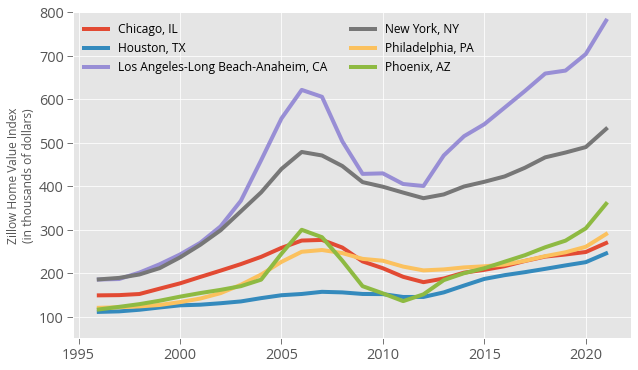

In [41]:
with plt.style.context("ggplot"):

    # Create figure and axes
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Plot for each unique city
    for city in annual_ZHVI["RegionName"].unique():
        
        # select the data for this city
        selection = annual_ZHVI["RegionName"] == city
        df = annual_ZHVI.loc[selection]

        # plot
        ax.plot(df["Year"], df["ZHVI"] / 1e3, label=city, linewidth=4)

    
    # Format the axes
    ax.set_ylim(50, 800)
    ax.legend(loc=0, ncol=2, fontsize=12)
    ax.set_ylabel("Zillow Home Value Index\n(in thousands of dollars)")

### Home values in Philadelphia have only recently recovered to pre-2008 levels

## Plotting the results: Zillow Rent Index

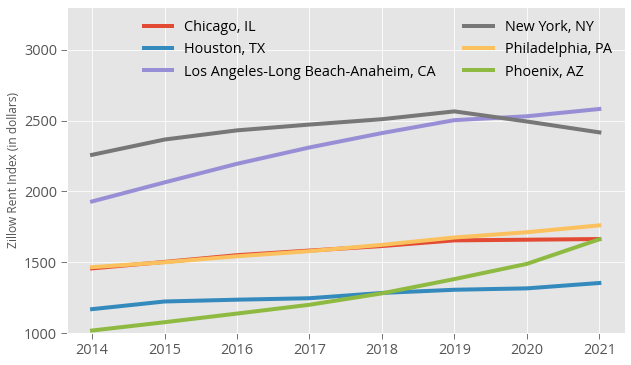

In [42]:
with plt.style.context('ggplot'):
    
    # Create the figure and axes
    fig, ax = plt.subplots(figsize=(10,6))
    
    # Loop over the cities to plot each one
    for city in annual_ZRI['RegionName'].unique():
        
        # Select the city data
        selection = annual_ZRI['RegionName'] == city
        df = annual_ZRI.loc[selection]
        
        # Plot
        ax.plot(df['Year'], df['ZRI'], label=city, linewidth=4)
    
    # Format
    ax.set_ylim(1000, 3300)
    ax.legend(loc=0, ncol=2)
    ax.set_ylabel('Zillow Rent Index (in dollars)')

### Rent prices in Philadelphia have remained relatively flat, relative to other large cities.

## Week #2: Data Visualization Fundamentals


- **Week #2 repository:** https://github.com/MUSA-550-Fall-2021/week-2
- Recommended readings for the week listed here

## A brief history

Starting with two of my favorite historical examples, and their modern renditions...

## Example 1: the pioneering work of W. E. B. Du Bois


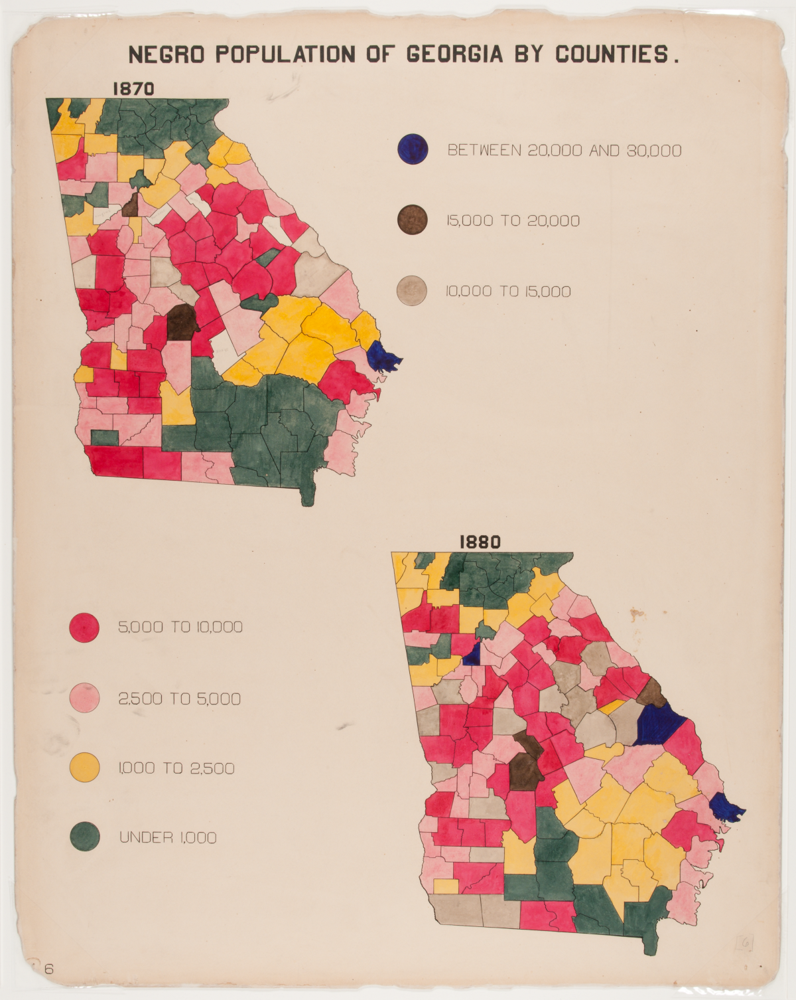

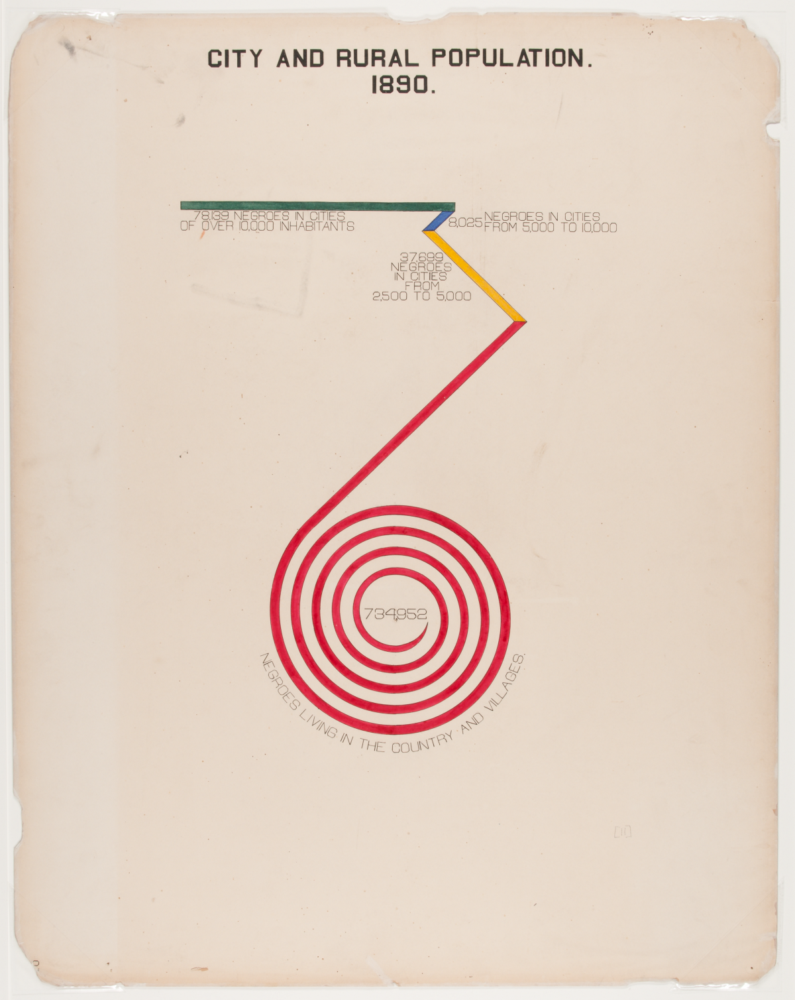

## Re-making the Du Bois Spiral with census data

## The demographics of whites in seven states

<center>
    <img src=attachment:Screen%20Shot%202019-01-27%20at%209.23.16%20PM.png width=850></img>
    <img src=attachment:Screen%20Shot%202019-01-27%20at%209.23.25%20PM.png width=600></img>
</center>

Green is urban, blue suburban, yellow small town, red rural.
[Source](http://bl.ocks.org/emeeks/raw/3993c03914e81f1d57650292b3001b27/)
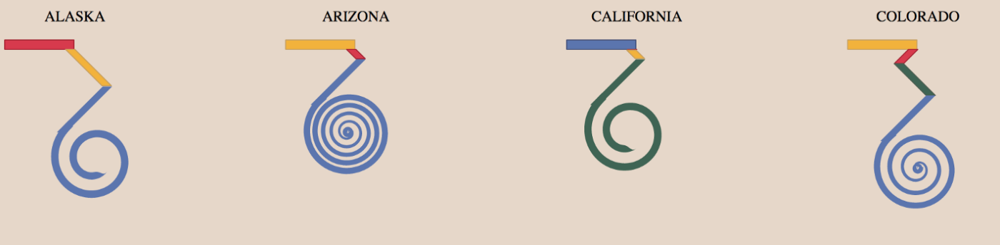
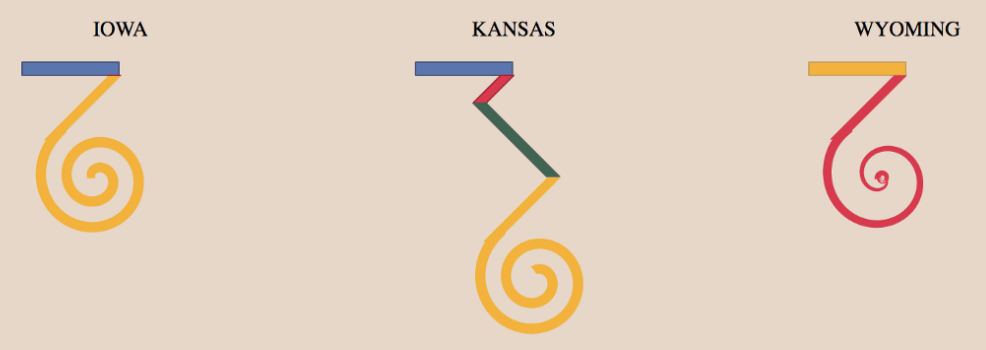

## Additional references

- [A 6-part blog series on W. E. B. Du Bois' Data Visualization](https://towardsdatascience.com/w-e-b-du-bois-staggering-data-visualizations-are-as-powerful-today-as-they-were-in-1900-64752c472ae4)
- [An article on historical data visualization](https://towardsdatascience.com/how-to-remake-historical-data-visualization-and-why-you-should-c25874fc4804)
- [W. E. B. Du Bois’s Data Portraits: Visualizing Black America](https://www.amazon.com/W-Boiss-Data-Portraits-Visualizing/dp/1616897066)

## Example 2: the Statistical Atlas of the United States

- First census: 1790
- First map for the census: 1850
- First Statistical Atlas: 1870
- Largely discontinued after 1890, except for the [2000 Census Atlas](https://www.census.gov/population/www/cen2000/censusatlas/)


## Using modern data

See http://projects.flowingdata.com/atlas, by Nathan Yau

## Industry and Earnings by Sex

<center>
    <img src=attachment:salary-by-sex.png width=800></img>
</center>
Source: American Community Survey, 5-Year, 2009-2013
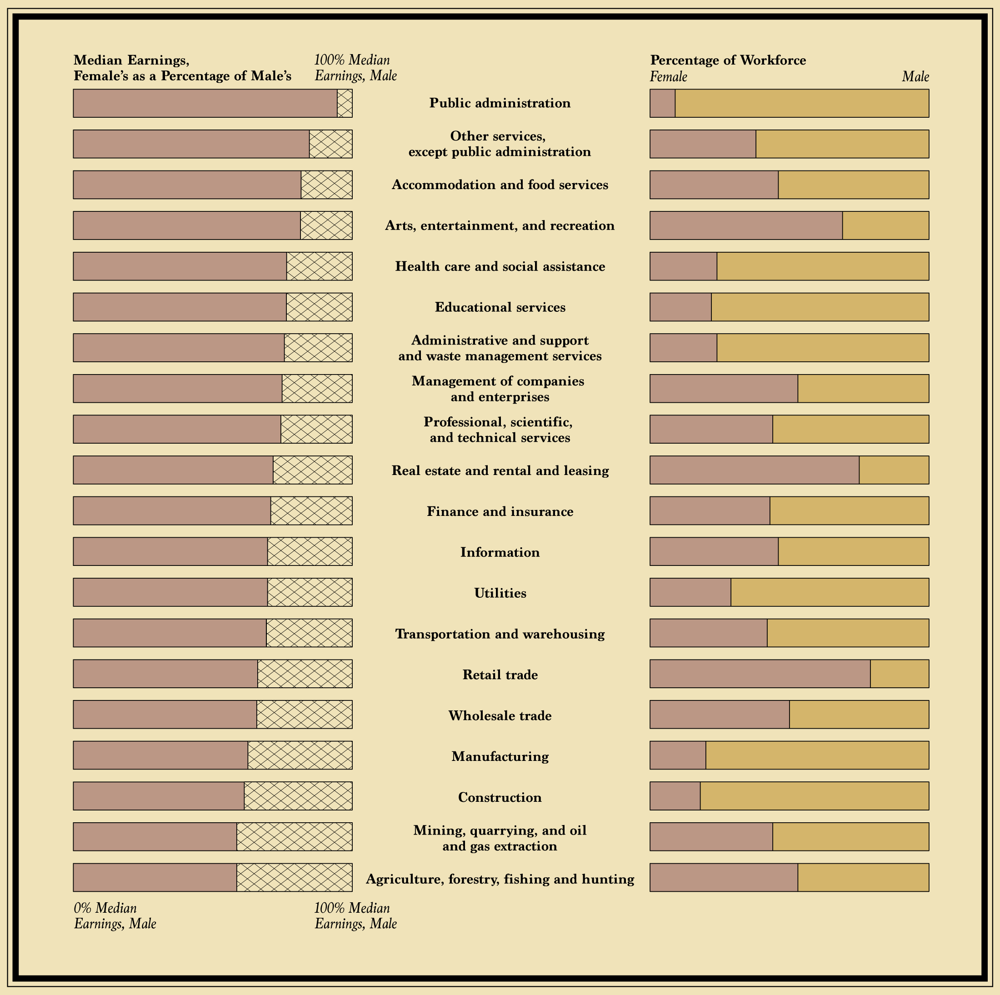

## Median Household Income
<center>
    <img src=attachment:income-median-household.png width=800></img>
</center>

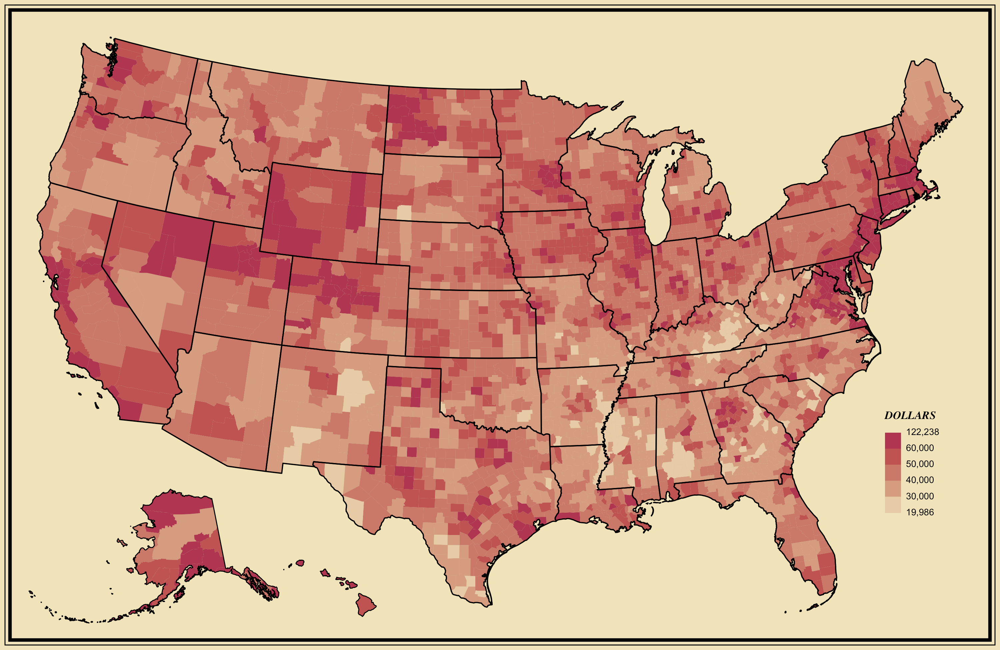

## Many more examples...
<center>
    <img src=attachment:Screen%20Shot%202019-01-27%20at%209.41.24%20PM.png width=800></img>
</center>
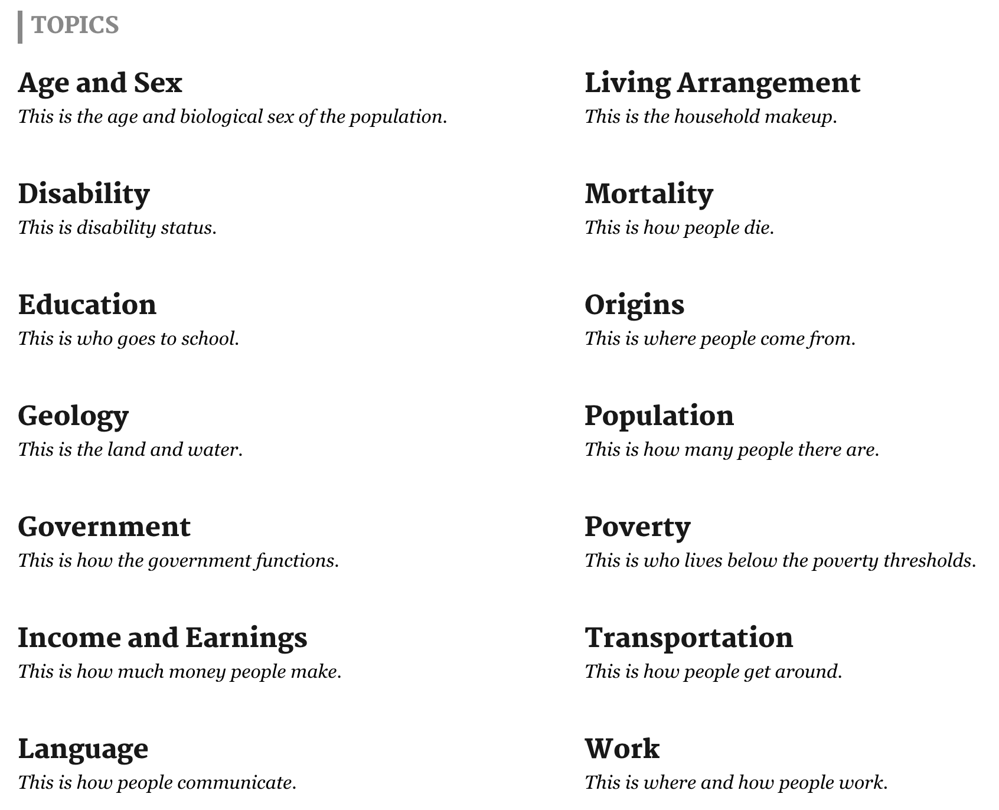

## More recently...

## Two main movements:

- 1st wave: clarity
- 2nd wave: the grammar of visualization

## Wave 1: Clarity

- Pioneered by Edward Tufte and his release of **The Visual Display of Quantitative Information** in 1983
- Focuses on clarity, simplicity, and plain color schemes
- Charts should be immediately accessible and readable

## The idea of "Chartjunk"

- Coined by Tufte in *Visual Display*
- Any unnecessary information on a chart

## An extreme example
<center>
    <img src=attachment:Chartjunk-example.svg.png width=600></img>
</center>
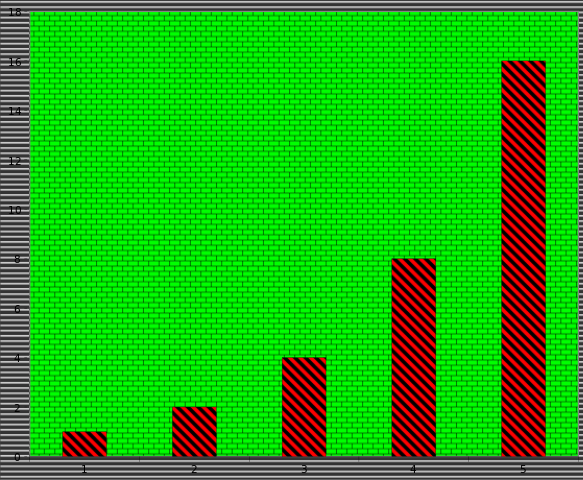

<center>
    <img src=attachment:Macedonian_statistical_regions_-_it.png width=600></img>

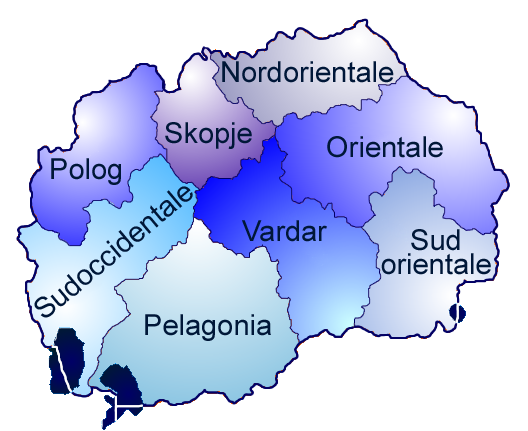

## Wave 2: the grammar of visualization

- Influenced by *The Grammar of Graphics* by Leland Wilkinson in 1999
- Focuses on encoding data via channels onto geometry
- Mapping data attributes on to graphical channels, e.g., length, angle, color, or position (or any other graphical character)

- Less focus on clarity, more on the encoding system
- Leads to many, many (perhaps confusing) ways of visualizing data
- `ggplot2` provides an R implementation of *The Grammar of Graphics*
- A few different Python libraries available

## Where are we now?

- Both movements converging together
- More visualization libraries available now than ever 

## A survey of common tools

<center>
<img src=attachment:1_v6V5D5U73qaZSKgu3O9I9Q.png width=800></img>
</center>
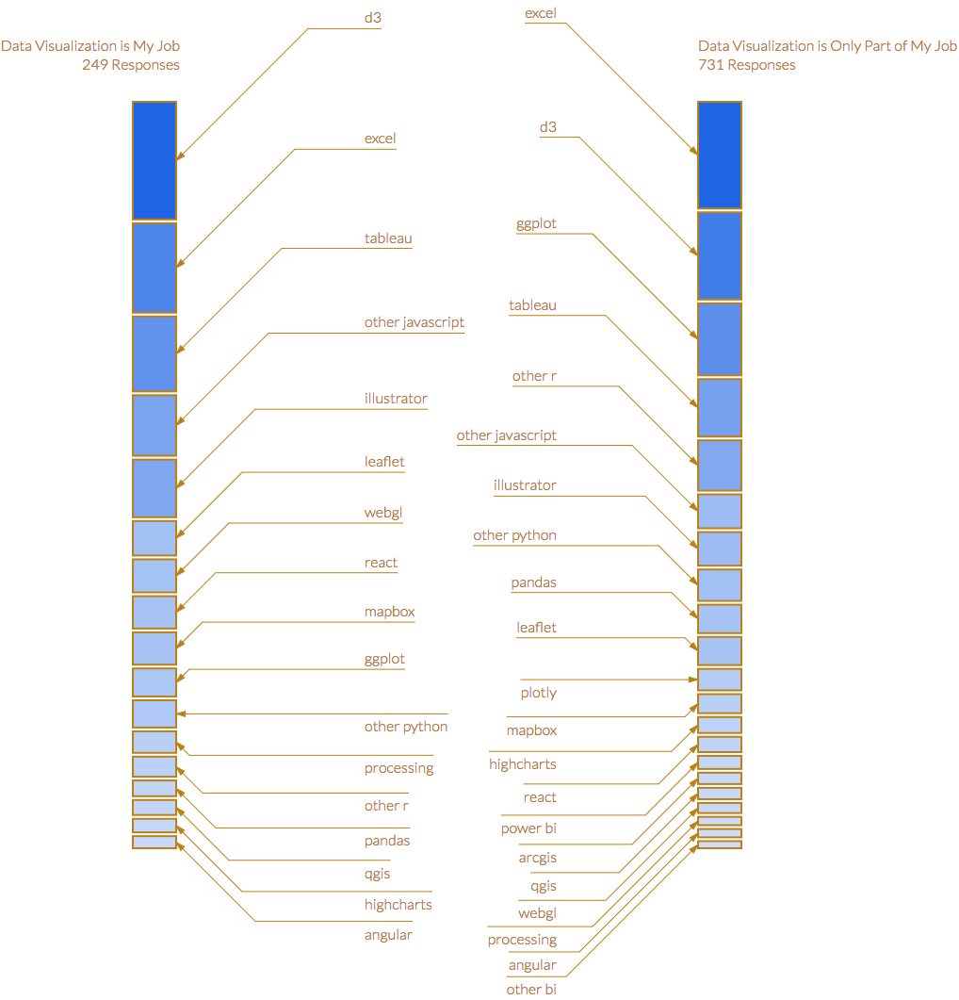

- From a [2017 survey by Elijah Meeks](https://medium.com/@Elijah_Meeks/2017-data-visualization-survey-results-40688830b9f2)
- Data visualization engineer: Apple, Netflix
- Excellent data viz resource
- Find him on [Twitter](https://twitter.com/Elijah_Meeks) or [Medium](https://medium.com/@Elijah_Meeks): @Elijah_Meeks
- Executive director of the [Data Visualization Society](https://www.datavisualizationsociety.com/)

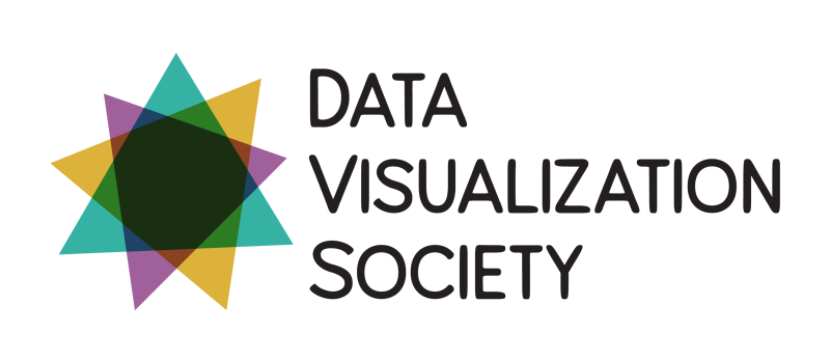</img>

- Community-based data viz organization
- Great resources for beginners
- Check out the [Nightingale](https://medium.com/nightingale): The Data Visualization Society's Blog

## The 7 kinds of data viz people

- From [this blog post](https://medium.com/visualizing-the-field/the-7-kinds-of-data-visualization-people-9964e80443a7)
- Illustrations by [Susie Lu](https://twitter.com/DataToViz)

<center>
    <img src=attachment:Screen%20Shot%202019-01-27%20at%2010.21.08%20PM.png width=400></img>
</center>
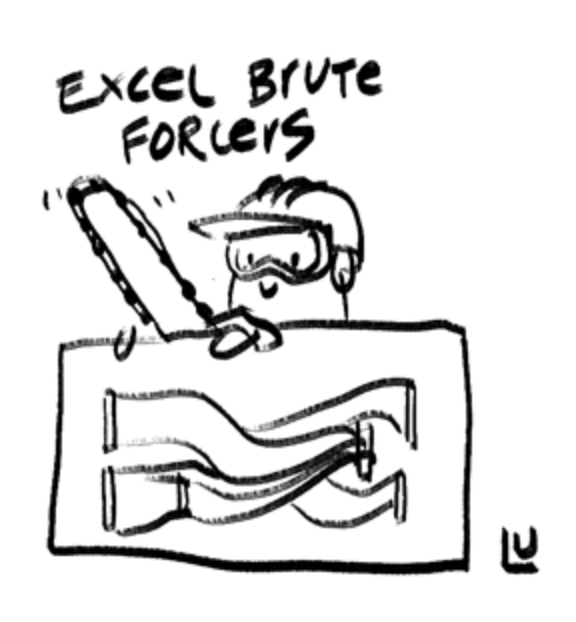

<center>
    <img src=attachment:Screen%20Shot%202019-01-27%20at%2010.22.17%20PM.png width=400></img>
</center>
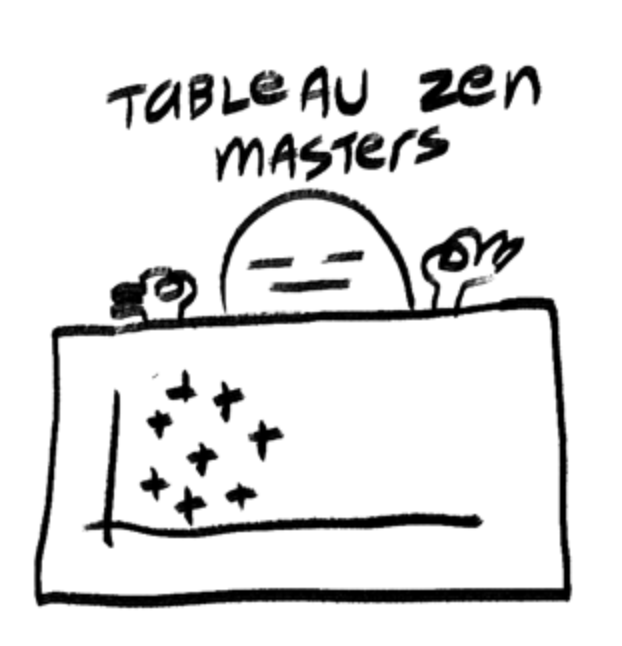

<center>
    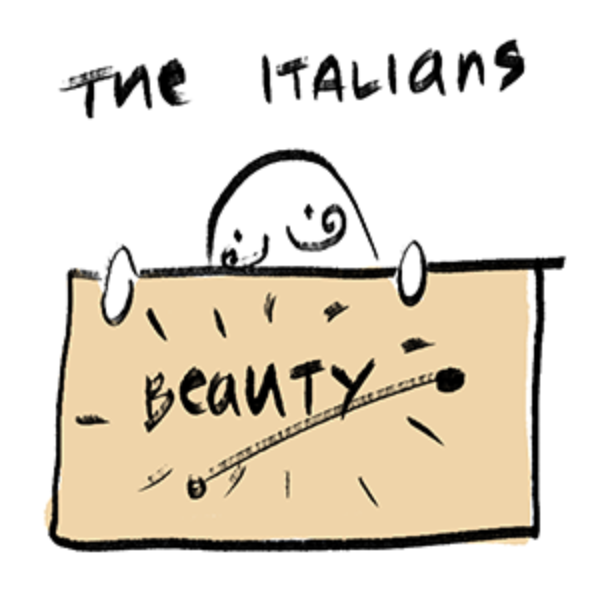</img>
</center>

<center>
    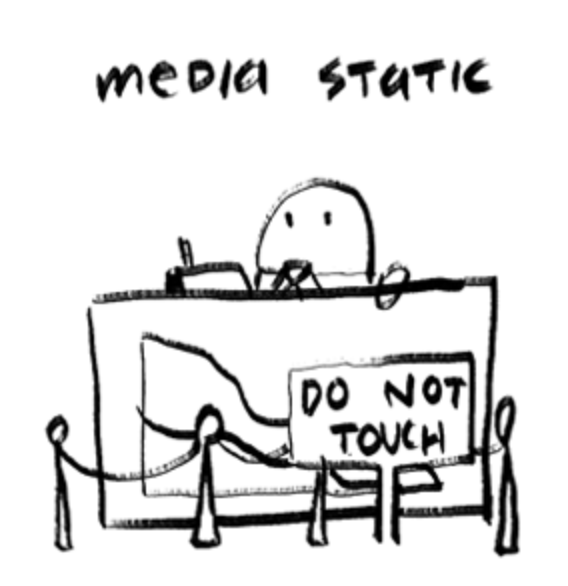</img>
</center>

<center>
    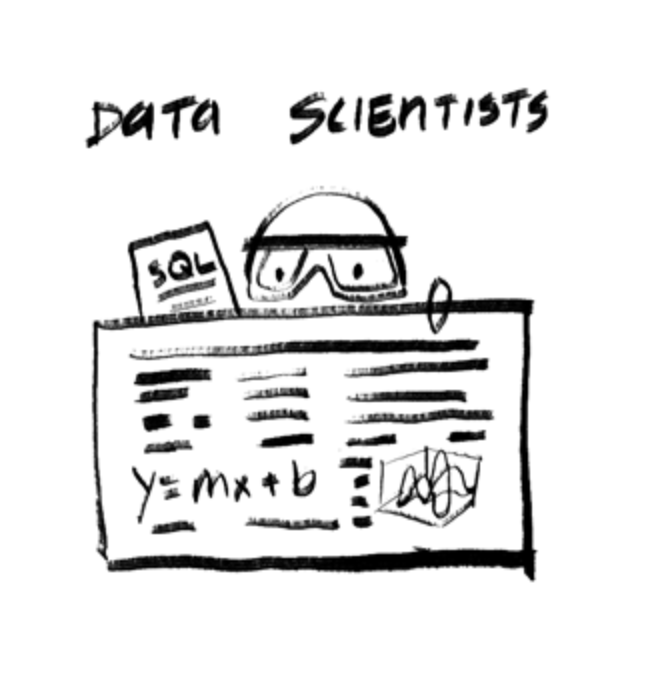</img>
</center>

<center>
    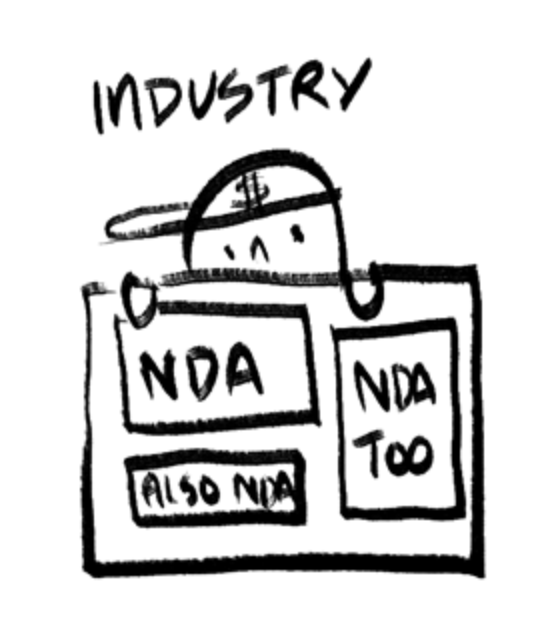</img>
</center>

<center>
    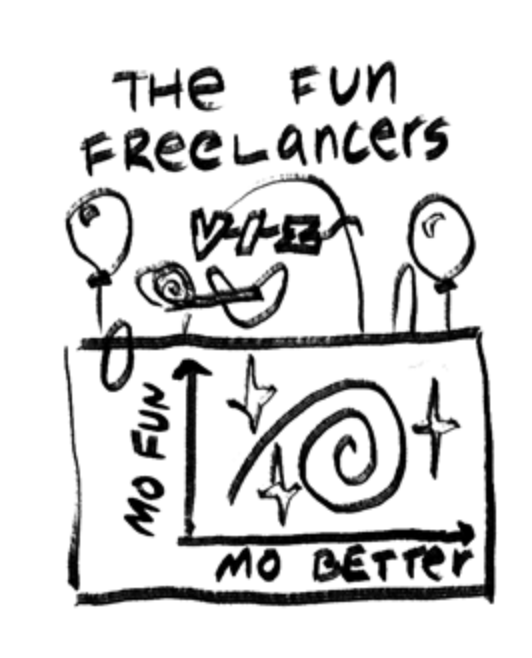</img>
</center>

See, e.g. [Data Sketches](http://www.datasketch.es/)

## Data visualization as communication 

- Data visualization is primarily a *communication* and *design* problem, not a technical one
- Two main modes: 
    - **Fast**: quickly understood or quickly made (or both!)
    - **Slow**: more advanced, focus on design, takes longer to understand and/or longer to make

## Fast visualization

- **Classic trope**: a report for busy executives created by subject experts $\rightarrow$ as clear and simplified as possible
- Leads readers to think that if the chart is not immediately understood then it must be a failure
- The dominant method of data visualization
    - E.g., [Create a Tableau Dashboard in Just 10 Minutes](https://www.tableau.com/about/blog/2015/12/how-format-beautiful-interactive-key-metrics-dashboard-46263)

## Moving beyond fast visualizations

- Thinking about what charts **say**, beyond what is immediately clear
- Focusing on colors, design choices

## Example: Fatalities in the Iraq War

by [Simon Scarr](https://twitter.com/SimonScarr) in 2011

<center>
    <img src=attachment:Iraqs-bloody-toll-1040x1574.jpg width=700></img>
</center>
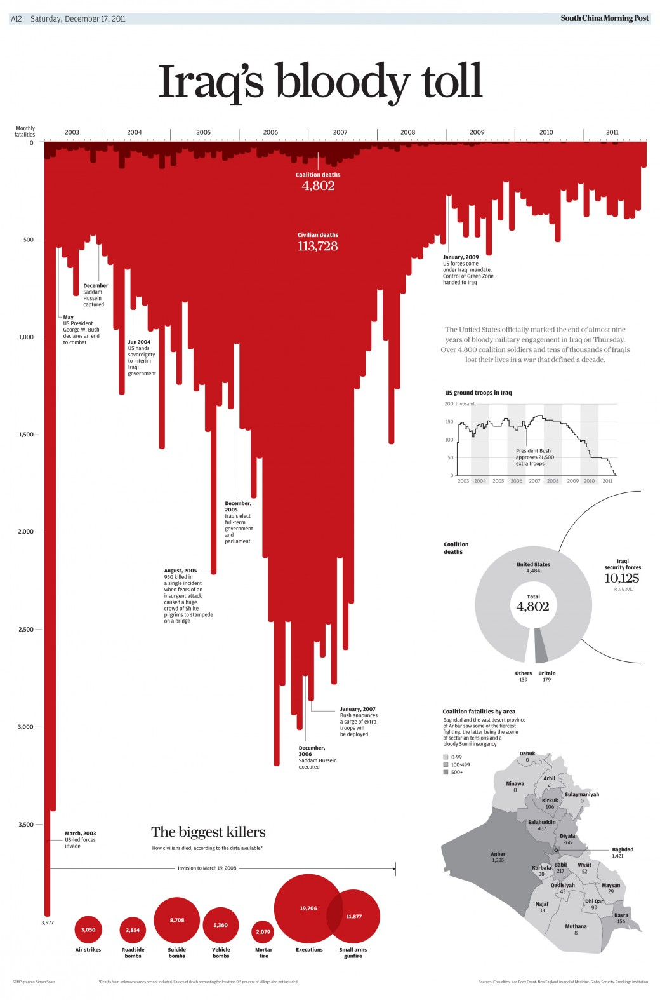

### What design choices drive home the implicit message?

<center>
    <img src=attachment:iraq-bars-up-and-blue-100668101-large.idge.png width=700></img>
</center>
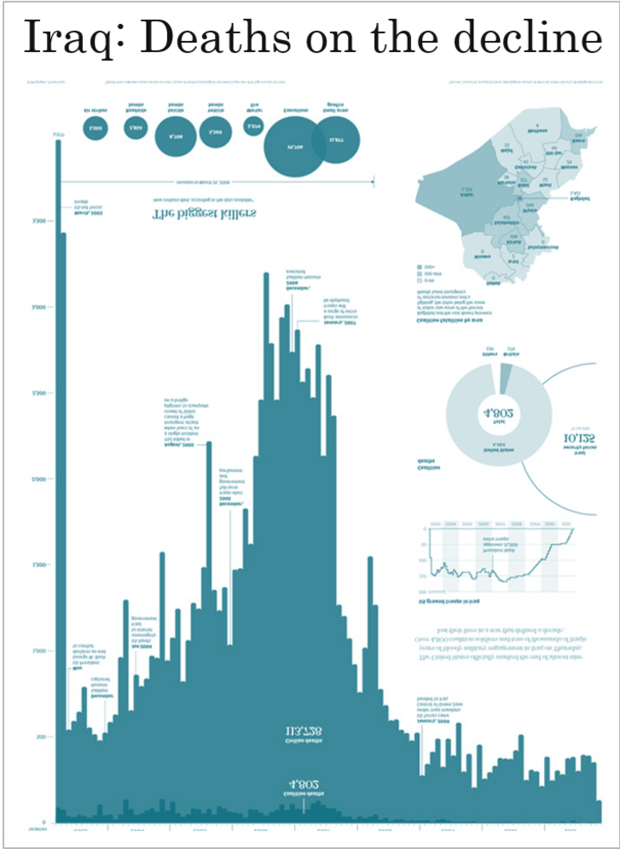

## Data Visualization as Storytelling

The same data, but different design choices...

## A negative portrayal 

<center>
    <img src=attachment:Screen%20Shot%202019-01-27%20at%2011.03.11%20PM.png width=600></img>
</center>
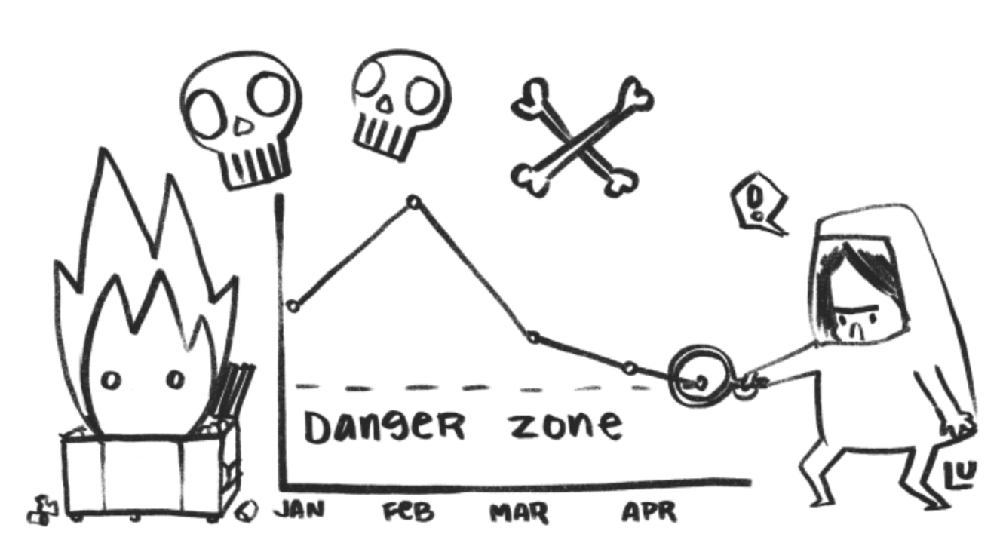

## A positive portrayal

<center>
    <img src=attachment:Screen%20Shot%202019-01-27%20at%2011.03.23%20PM.png width=600></img>
</center>
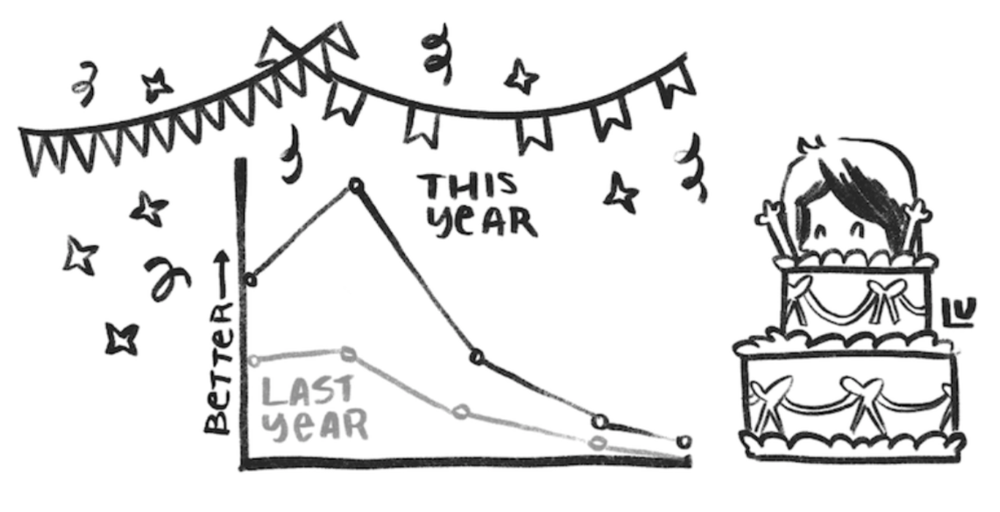

## Design choices matter & data viz has never been more important

Some recent examples...

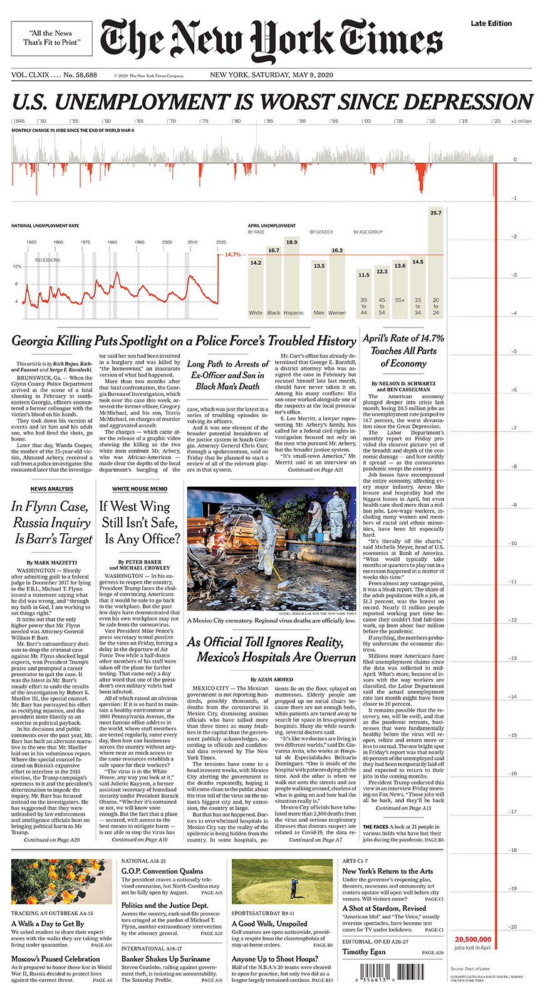

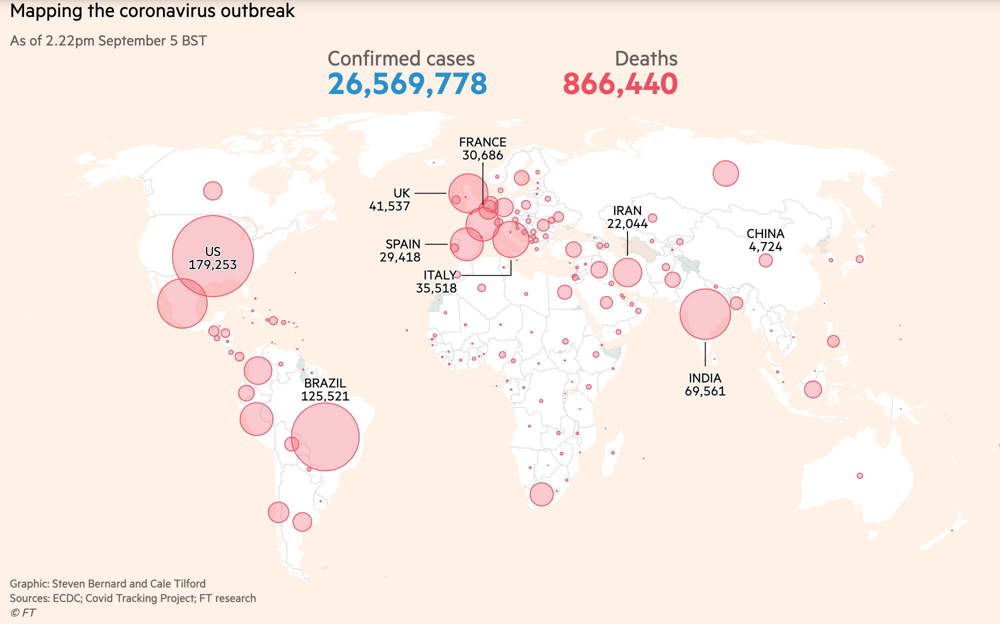

- [Data Viz's Breakthrough Moment in the COVID-19 Crisis](https://medium.com/nightingale/data-visualizations-breakthrough-moment-in-the-covid-19-crisis-ce46627c7db5)
- [Interview with John Burn-Murdoch About his COVID Data Viz](https://medium.com/nightingale/how-john-burn-murdochs-influential-dataviz-helped-the-world-understand-coronavirus-6cb4a09795ae)
- [John Burn-Murdoch's Twitter](https://twitter.com/jburnmurdoch)
- COVID-19 Data Viz from the Financial Times
  - [Coronavirus Tracker](https://www.ft.com/content/a2901ce8-5eb7-4633-b89c-cbdf5b386938)
  - [Global Economic Recovery Tracker](https://www.ft.com/content/272354f2-f970-4ae4-a8ae-848c4baf8f4a)

## Data Viz Style Guides

Lots of companies, cities, institutions, etc. have started *design guidelines* to improve and standardize their data visualizations.

One I particularly like: [City of London Data Design Guidelines](https://data.london.gov.uk/blog/city-intelligence-data-design-guidelines/)

First few pages are listed in the "Recommended Reading" portion of this week's README.

London's style guide includes some basic data viz principles that everyone should know and includes the following example:

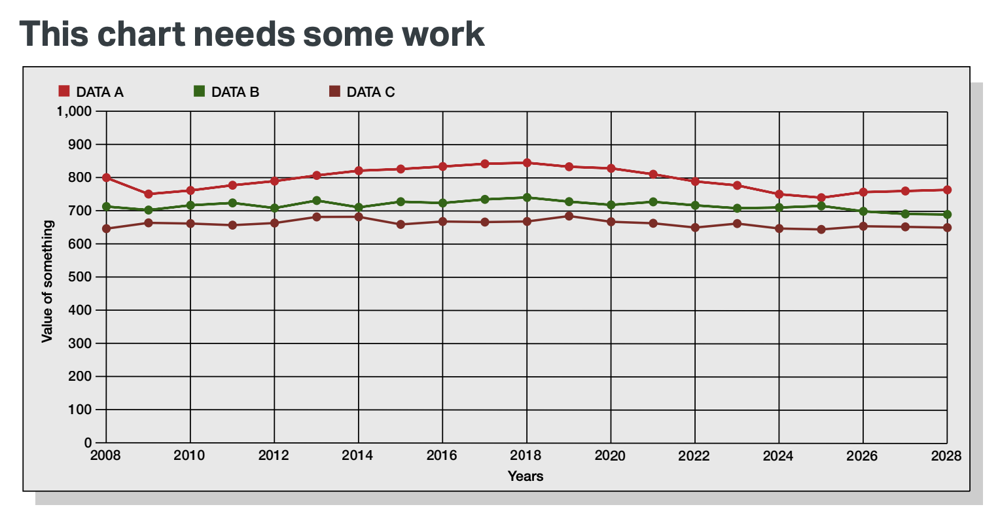</img>

[City of London Data Design Guidelines](https://data.london.gov.uk/blog/city-intelligence-data-design-guidelines/)

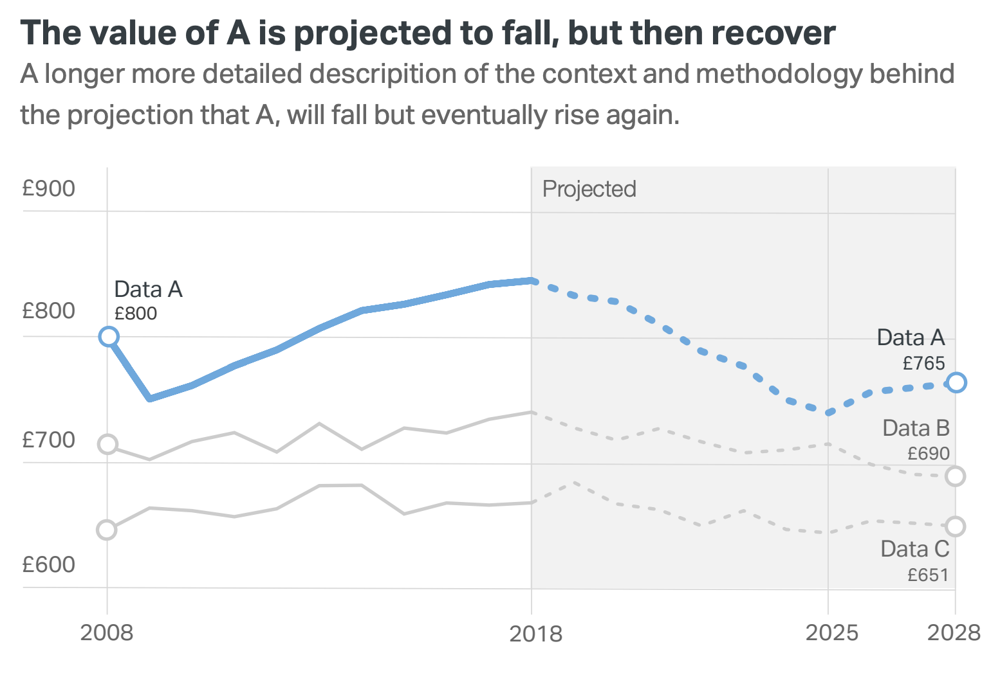</img>

[City of London Data Design Guidelines](https://data.london.gov.uk/blog/city-intelligence-data-design-guidelines/)

## Good rules

- Less is more — minimize "chartjunk"
- Don't use legends if you can label directly
- Use color / line weight to focus the reader on the data you want to emphasize
- Don't make the viewer tilt their head 
— Use titles/subtitles to explain what is being plotted

## Now onto colors...

Choose your colors carefully:

- **Sequential** schemes: for continuous data that progresses from low to high
- **Diverging** schemes: for continuous data that emphasizes positive or negative deviations from a central value
- **Qualitative** schemes: for data that has no inherent ordering, where color is used only to distinguish categories

## ColorBrewer 2.0

- The classic tool for color selection
- Handles all three types of color schemes and provides a map-based visualization
- Provides explanations from Cynthia Brewer's published works on color theory

<center>
    <img src=attachment:Screen%20Shot%202019-01-28%20at%2012.25.14%20AM.png width=600></img>
</center>
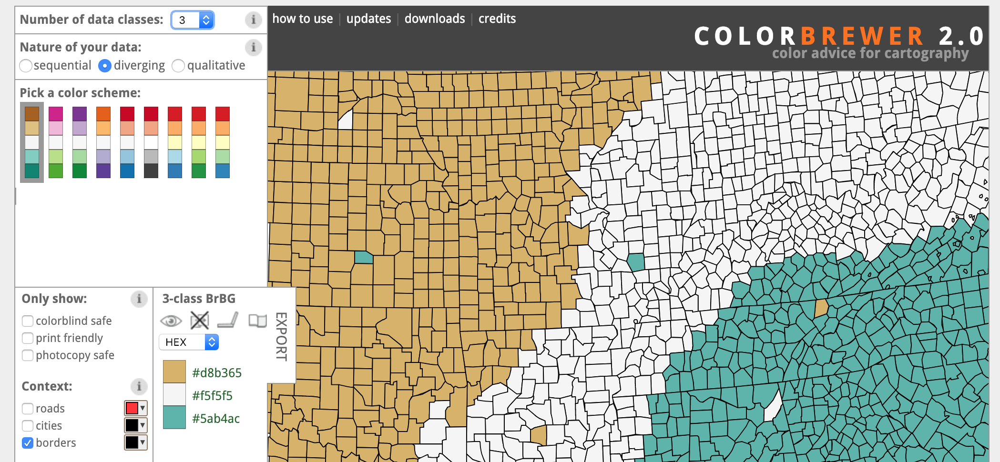

- Tests whether colors are colorblind safe, printer friendly, and photocopy safe
- ColorBrewer palettes are included by default in `matplotlib`

See: http://colorbrewer2.org

## Perceptually uniform color maps

- Created for `matplotlib` and available by default
- **perceptually uniform**: equal steps in data are perceived as equal steps in the color space
- robust to color blindness
- colorful and beautiful

**For quantitative data, these color maps are very strong options**

<center>
    <img src=attachment:Screen%20Shot%202019-01-28%20at%2012.13.13%20AM.png width=700></img>
</center>
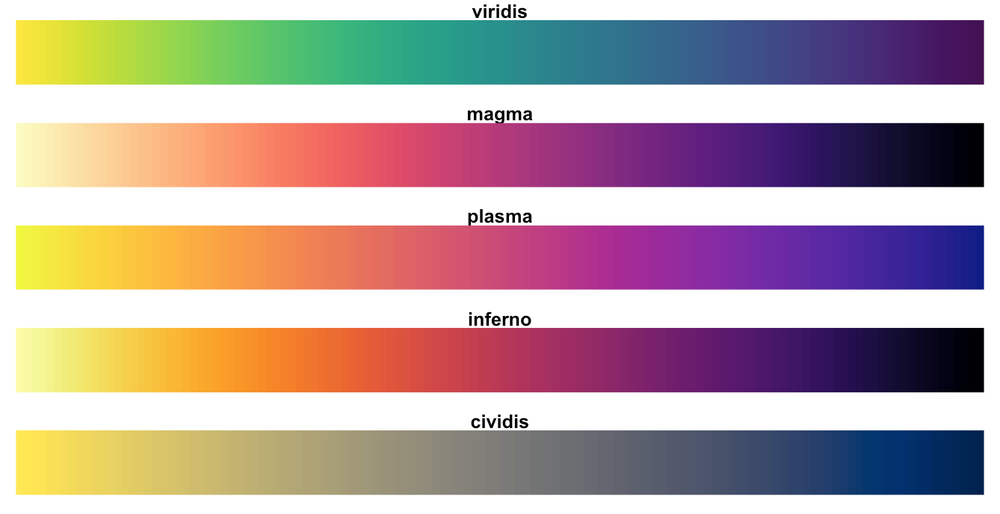

## Need more colors?

Almost too many tools available...

## Some of my favorites

- [Adobe Color CC](https://color.adobe.com/explore): allows you to explore other people's color palettes and create new ones
- [Paletton](http://paletton.com/): similar to Adobe Color, but slightly more advanced
- [Chroma.js Color Scale Helper](https://gka.github.io/palettes/): create color palettes by interpolating between named HTML colors
- [Colorpicker for data](http://tristen.ca/hcl-picker): automatically generate new color palettes, but they aren't always useful

## Making sure your colors work: [Viz Palette](https://projects.susielu.com/viz-palette)

<center>
<img src=attachment:full-1807170-vispalette.png width=800></img>
</center>
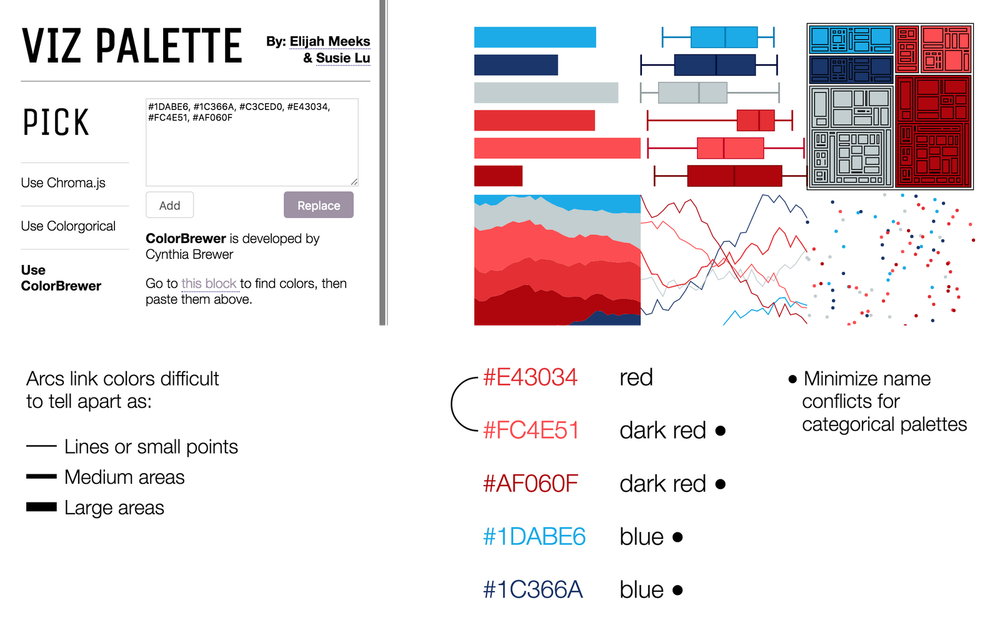

## Wrapping up: some good rules to live by

- Optimize your color map for your dataset
- Think about who your audience is
- Avoid palettes with too many colors: ColorBrewer stops at ~9 for a reason
- Maintain a theme and make it pretty
- Think about how color interacts with the other parts of the visualization

## Now onto the Python data viz landscape

So many tools...so little time

<center>
    <img src=attachment:unnamed.png width=800></img>
</center>
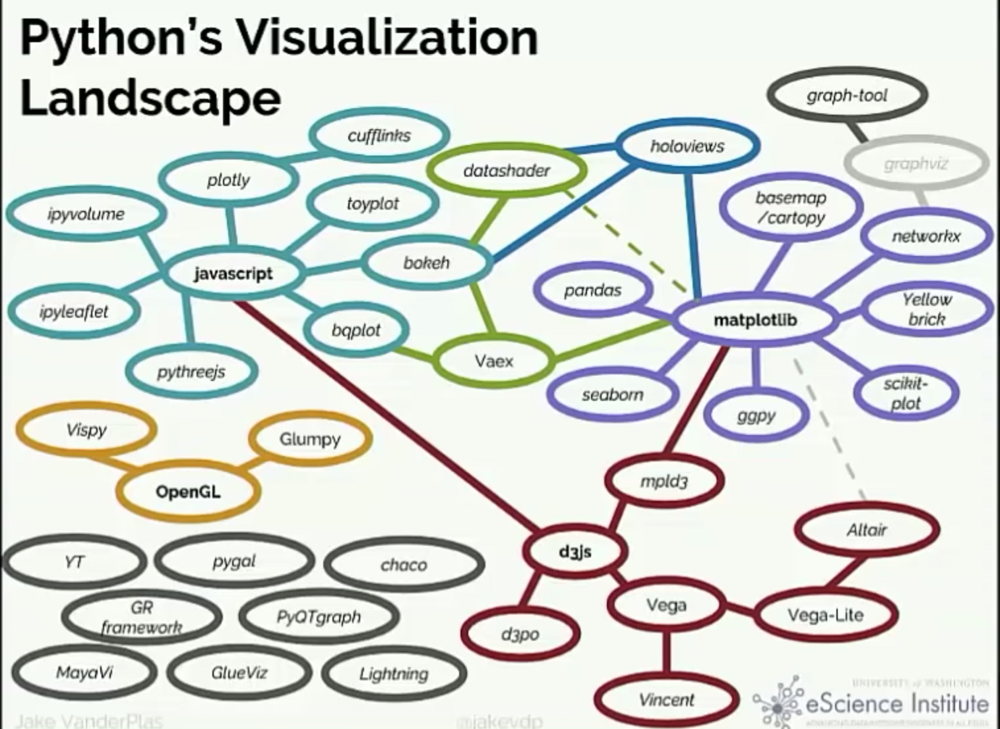

## Which one is the best?

## There isn't one...

You'll use different packages to achieve different goals, and they each have different things they are good at.

Today, we'll focus on: 
- **matplotlib:** the classic
- **pandas:** built on matplotlib, quick plotting built in to DataFrames
- **seaborn:** built on matplotlib, adds functionality for fancy statistical plots
- **altair:** interactive, relying on javascript plotting library Vega

And next week for geospatial data:
- holoviews/geoviews
- matplotlib/cartopy
- geopandas/geopy

**Goal:** introduce you to the most common tools and enable you to know the best package for the job in the future

## The classic: matplotlib

- Very well tested, robust plotting library 
- Can reproduce just about any plot (sometimes with a lot of effort)

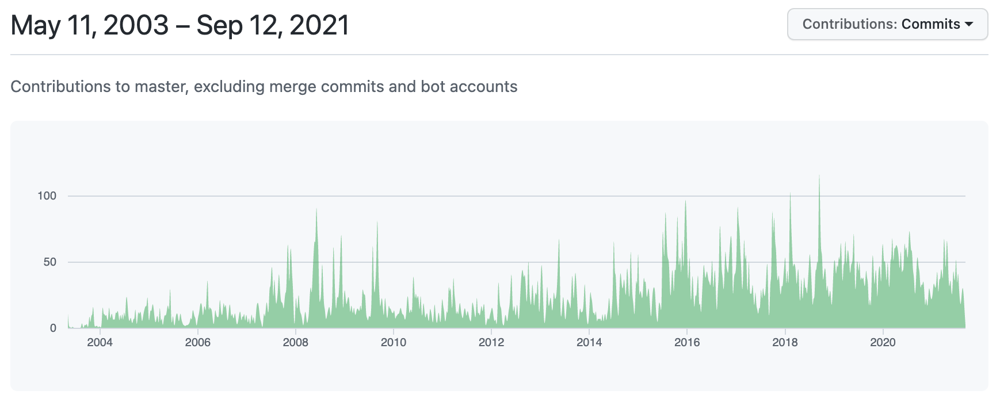

## With some downsides...

- Imperative, overly verbose syntax
- Little support for interactive/web graphics

## Available functionality

- Don't need to memorize syntax for all of the plotting functions
- For sample plots: https://matplotlib.org/tutorials/introductory/sample_plots.html
- See the cheat sheet available in this repository

## Most commonly used: 

- Simple line plots: [plot()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html)
- Multiple axes per figure: [subplot()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplot.html)
- 2D image (RGB) data : [imshow()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html)
- 2D arrays: [pcolormesh()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.pcolormesh.html)
- Histograms: [hist()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.hist.html)
- Bar charts: [bar()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.bar.html)
- Pie charts: [pie()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.pie.html)
- Scatter plots: [scatter()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.scatter.html)

## Working with matplotlib

We'll use the *object-oriented* interface to matplotlib
- Create `Figure` and `Axes` objects
- Add plots to the `Axes` object
- Customize any and all aspects of the `Figure` or `Axes` objects


- **Pro**: Matplotlib is extraordinarily general — you can do pretty much *anything* with it
- **Con**: There's a steep learning curve, with a lot of matplotlib-specific terms to learn

## Learning the matplotlib language

<img width="600" src="https://pbpython.com/images/matplotlib-anatomy.png"></img>

[Source](https://matplotlib.org/faq/usage_faq.html)

## Recommended Reading


- [Introduction to the object-oriented interface](https://pbpython.com/effective-matplotlib.html)
- A good walk through on using matplotlib to customize plots
- Listed in the README for this week's repository too

<img width="700" src="https://pbpython.com/images/matplotlib-pbpython-example.png"></img>

## Let's explore colormaps in matplotlib

In [43]:
import numpy as np
from matplotlib import pyplot as plt

In [44]:
# Generate some random data using numpy (numbers between -1 and 1)
# Shape is (100, 100)
data = 2 * np.random.random(size=(100,100)) - 1
print(data.min(), data.max(), data.mean())

-0.9999615511221818 0.9996042691107014 -0.005195764201420571


## The new default color map: viridis

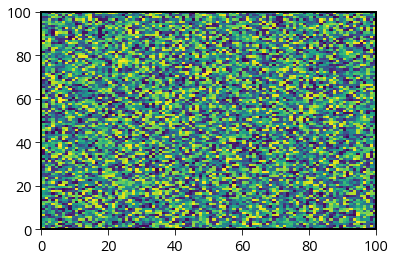

In [45]:
plt.pcolormesh(data, cmap='viridis')

## The old default: jet

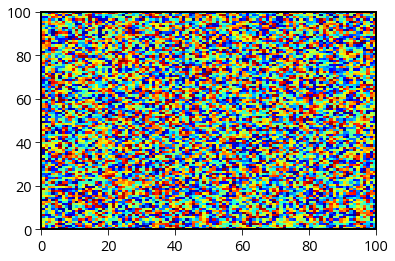

In [46]:
plt.pcolormesh(data, cmap='jet')

## Better suited for a diverging palette...

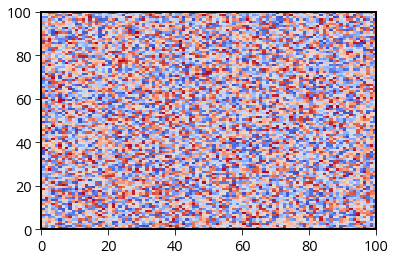

In [47]:
plt.pcolormesh(data, cmap='coolwarm')

**Important bookmark**: [Choosing Color Maps in Matplotlib](https://matplotlib.org/tutorials/colors/colormaps.html
)


In [48]:
# print out all available color map names
print(len(plt.colormaps()))

166


## Let's load some data to plot...

We'll use the [Palmer penguins](https://github.com/allisonhorst/palmerpenguins) data set, data collected for three species of penguins at Palmer station in Antartica

<img width=300 src="https://github.com/allisonhorst/palmerpenguins/blob/master/man/figures/palmerpenguins.png?raw=true"></img>

<img src="https://github.com/allisonhorst/palmerpenguins/blob/master/man/figures/lter_penguins.png?raw=true" width=500>

Artwork by [@allison_horst](https://github.com/allisonhorst)

In [51]:
# Load data on Palmer penguins
penguins = pd.read_csv("./data/penguins.csv")
penguins.head(n=10)    

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,year
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,male,2007
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,female,2007
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,female,2007
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN,2007
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,female,2007
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,male,2007
6,Adelie,Torgersen,38.9,17.8,181.0,3625.0,female,2007
7,Adelie,Torgersen,39.2,19.6,195.0,4675.0,male,2007
8,Adelie,Torgersen,34.1,18.1,193.0,3475.0,NaN,2007
9,Adelie,Torgersen,42.0,20.2,190.0,4250.0,NaN,2007


Data is already in *tidy* format

## A simple visualization

> I want to scatter flipper length vs. bill length, colored by the penguin species

## Using matplotlib 

Plotting Adelie...
Plotting Chinstrap...
Plotting Gentoo...


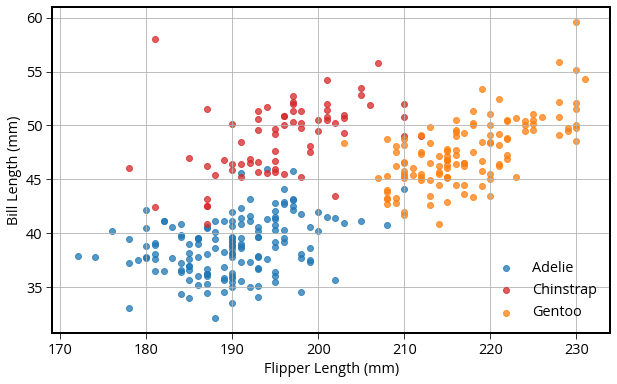

In [52]:
# Initialize the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Color for each species
color_map = {"Adelie": "#1f77b4", "Gentoo": "#ff7f0e", "Chinstrap": "#D62728"}

# Group the data frame by species and loop over each group
# NOTE: "group" will be the dataframe holding the data for "species"
for species, group in penguins.groupby("species"):
    print(f"Plotting {species}...")

    # Plot flipper length vs bill length for this group
    ax.scatter(
        group["flipper_length_mm"],
        group["bill_length_mm"],
        marker="o",
        label=species,
        color=color_map[species],
        alpha=0.75,
    )

# Format the axes
ax.legend(loc="best")
ax.set_xlabel("Flipper Length (mm)")
ax.set_ylabel("Bill Length (mm)")
ax.grid(True)

## How about in `pandas`?

In [53]:
# Tab complete on the plot attribute of a dataframe to see the available functions
#penguins.plot.scatter?

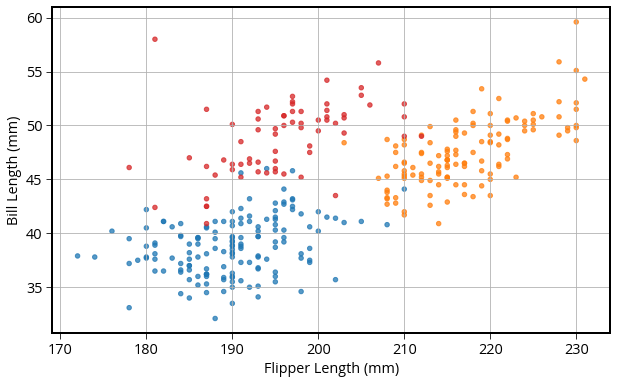

In [54]:
# Initialize the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Calculate a list of colors
color_map = {"Adelie": "#1f77b4", "Gentoo": "#ff7f0e", "Chinstrap": "#D62728"}
colors = [color_map[species] for species in penguins["species"]]

# Scatter plot two columns, colored by third
penguins.plot.scatter(
    x="flipper_length_mm",
    y="bill_length_mm",
    c=colors,
    alpha=0.75,
    ax=ax, # Plot on the axes object we created already!
)

# Format
ax.set_xlabel("Flipper Length (mm)")
ax.set_ylabel("Bill Length (mm)")
ax.grid(True)

**Note:** no easy way to get legend added to the plot in this case...

### Disclaimer

- In my experience, I have found the `pandas` plotting capabilities are good for quick and unpolished plots during the data exploration phase
- Most of the pandas plotting functions serve as shorcuts, removing some biolerplate matplotlib code 
- If I'm trying to make polished, clean data visualization, I'll usually opt to use matplotlib from the beginning

## That's it!

- See you on Wedndesday when we wrap up Data Viz Fundamentals